In [1]:
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline  
import tensorflow as tf
from glob import glob
from yolov3.yolov4_config import Create_Yolo
from yolov3.utils_config import load_yolo_weights, detect_image
from yolov3.configs_config import *
from PIL import Image

import os
import pandas as pd

if YOLO_TYPE == "yolov4":
    Darknet_weights = YOLO_V4_TINY_WEIGHTS if TRAIN_YOLO_TINY else YOLO_V4_WEIGHTS
if YOLO_TYPE == "yolov3":
    Darknet_weights = YOLO_V3_TINY_WEIGHTS if TRAIN_YOLO_TINY else YOLO_V3_WEIGHTS

yolo = Create_Yolo(input_size=YOLO_INPUT_SIZE)
load_yolo_weights(yolo, Darknet_weights) # use Darknet weights

In [2]:
yolo = Create_Yolo(input_size=YOLO_INPUT_SIZE, CLASSES=TRAIN_CLASSES)
yolo.load_weights("./checkpoints/new_lip_500/yolov3_custom") # use keras weights

# image path

In [3]:
tr = glob(r"teeth_including_lip_more\train/*.xml")
te = glob(r"teeth_including_lip_more\test/*.xml")
r5 = glob(r"C:\Users\NA_team_1\Desktop\test\*.jpg")

print("train data : {}".format(len(tr)))
print("validation data : {}".format(len(te)))
print("test data {}".format(len(r5)))

train data : 340
validation data : 85
test data 85


In [4]:
r1 = glob(r"teeth_including_lip_more\test/*.jpg")

In [5]:
r11 = glob(r"teeth_including_lip_more\train/*.jpg")

In [6]:
r2 =  glob(r"anomaly_data/*.jpg")

In [7]:
r3 =  glob(r"crop_anomaly/*.jpg")

In [8]:
r4 =  glob(r"use_image_poster\real_anomaly/*.jpg")

In [9]:
# # in dahun computer 
# coco_anomaly =  glob(r"C:\Users\NA_team2\TensorFlow-2.x-YOLOv3\TensorFlow-2.x-YOLOv3\val2017/*.jpg")

In [10]:
coco_anomaly =  glob(r"C:\Users\NA_team_1\Desktop\val2017\*.jpg")
np.random.seed(42)
a = np.random.randint(5000, size =76)
a = np.sort(a)
print(a)
anomaly_76 = [coco_anomaly[i] for i in a]

[  34  130  161  189  241  337  466  474  600  646  769  775  860  878
  975  995 1016 1021 1076 1082 1184 1267 1275 1363 1478 1500 1528 1585
 1685 1806 1899 1955 1981 2041 2047 2061 2363 2391 2433 2435 2556 2558
 2612 2613 2734 2747 2824 2888 2904 2919 3005 3073 3092 3152 3171 3202
 3342 3385 3444 3461 3556 3772 3798 3843 3890 3943 4014 4117 4297 4426
 4551 4555 4658 4798 4843 4911]


In [11]:
coco_center_crop = glob(r"C:\Users\NA_team_1\Desktop\coco_crop\*.jpg")

In [12]:
# braces =  glob(r"C:\Users\NA_team_1\Desktop\GitHub\TensorFlow-2.x-YOLOv3\braces/*.jpg")

In [3]:
brace_path = r"braces"

In [14]:
angled_path = r"angled"

# train

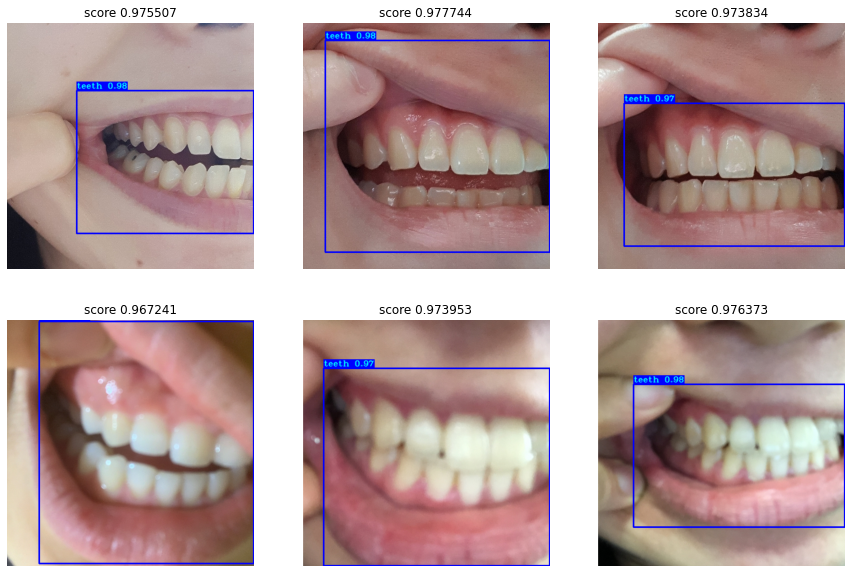

In [15]:
#plt.figure(figsize=(15,30))
#for i in range(18):
#    plt.subplot(6,3,i+1)
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# validation

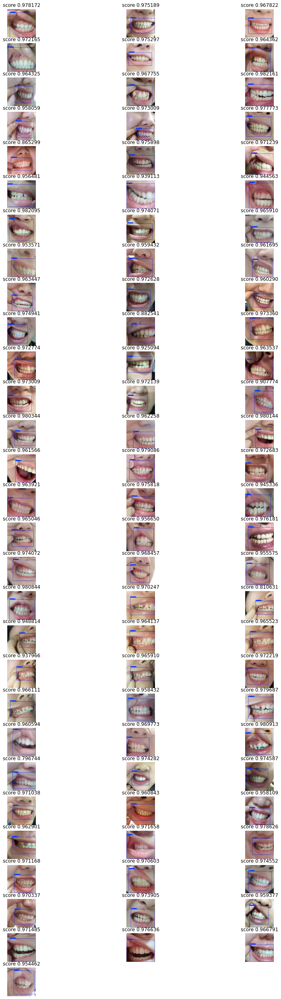

In [16]:
plt.figure(figsize=(15,45))
for i in range(85):
    plt.subplot(29,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

## test

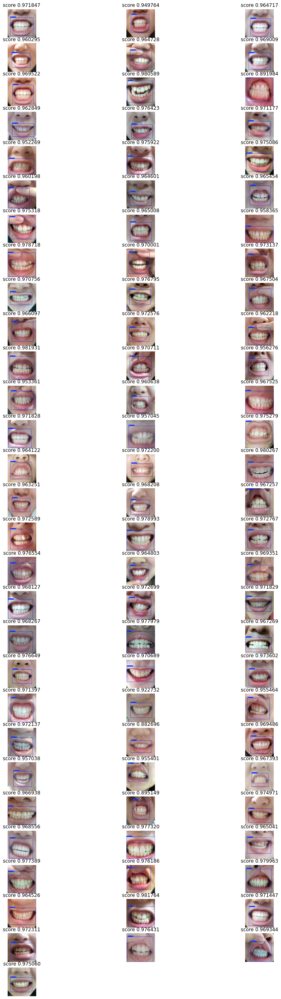

In [17]:
plt.figure(figsize=(15,45))
for i in range(85):
    plt.subplot(29,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# anomaly

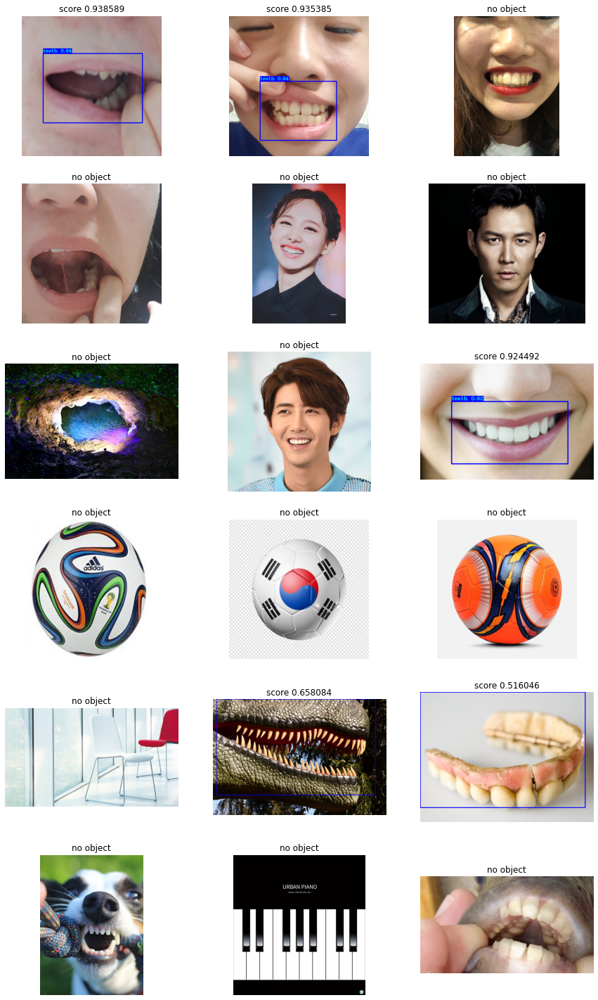

In [18]:
plt.figure(figsize=(15,30))
for i in range(18):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r2[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# crop anomaly

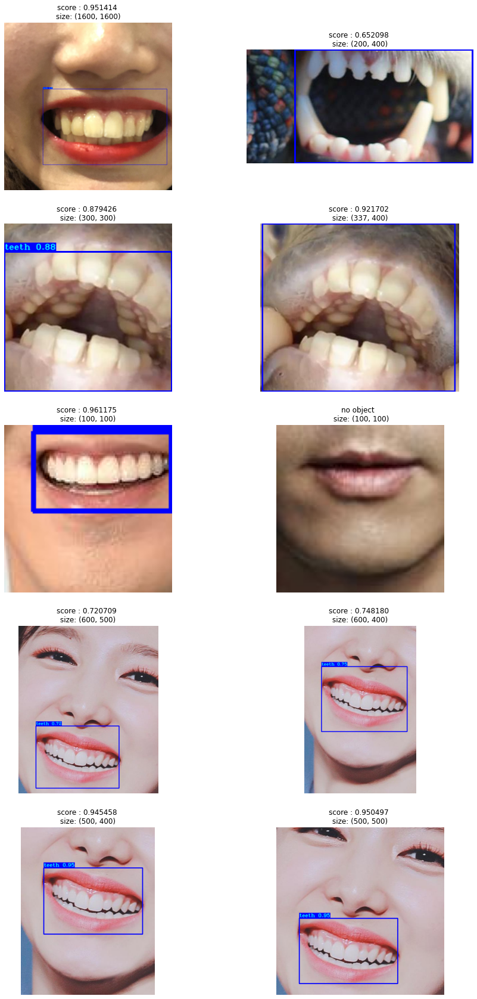

In [19]:
plt.figure(figsize=(15,30))
for i in range(len(r3)):
    plt.subplot(5,2,i+1)
    image, bboxes = detect_image(yolo, r3[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.5 , CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object  \n size: {}'.format(cv2.imread(r3[i]).shape[0:2]))
        plt.axis('off')
    else :
        plt.title('score : {0:2f} \n size: {1} '.format(bboxes[0][4], cv2.imread(r3[i]).shape[0:2]))
        plt.axis('off')
plt.show()

# coco 76

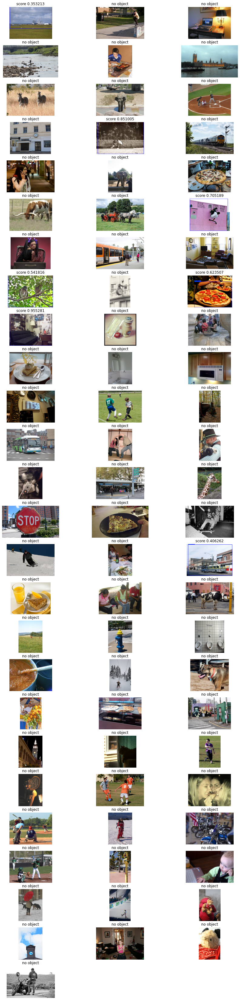

In [20]:
plt.figure(figsize=(15,60))
for i in range(76):
    plt.subplot(26,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, anomaly_76[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# coco 76 center crop

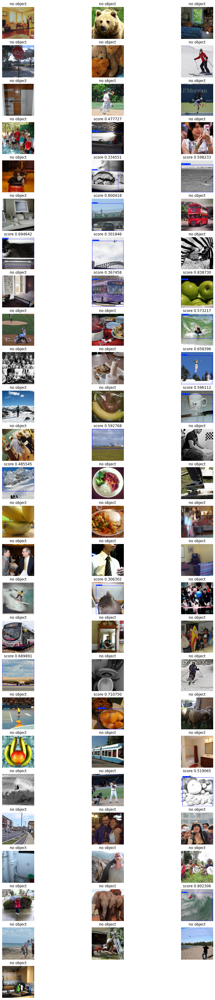

In [21]:
plt.figure(figsize=(15,60))
for i in range(76):
    plt.subplot(26,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_center_crop[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# braces

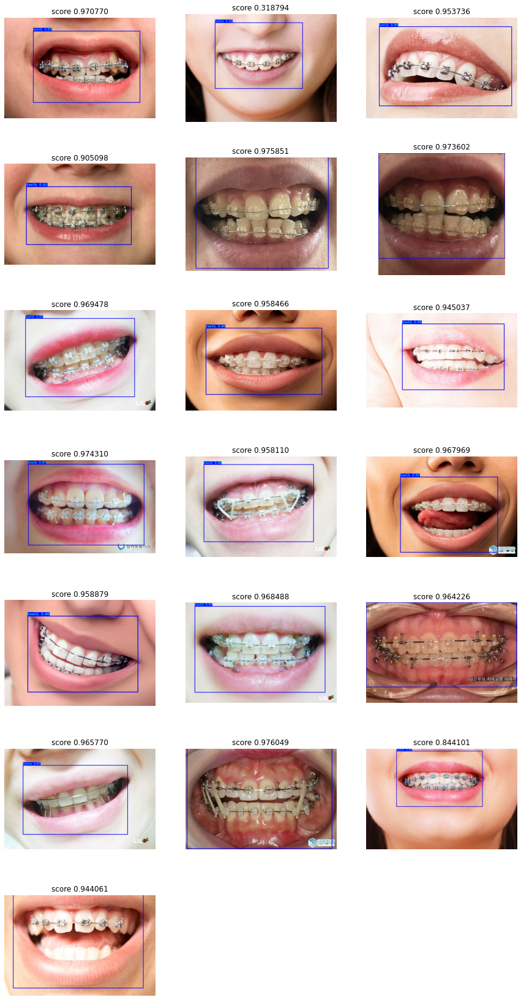

In [4]:
# it contain png files
plt.figure(figsize=(15,30))
for i in range(len(os.listdir(brace_path))):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# angle data

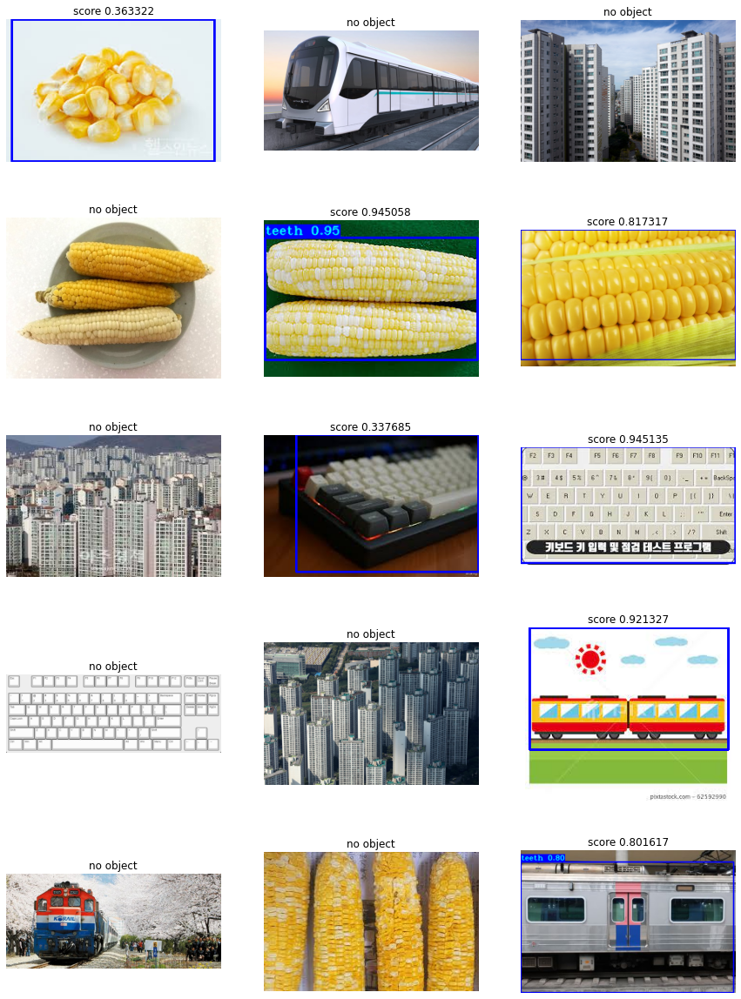

In [23]:
plt.figure(figsize=(15,30))
for i in range(len(os.listdir(angled_path))):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# score evaluate

In [24]:
train_score = [ ]
train_score_i = [ ]
valid_score = []
valid_score_i = []
anomaly_score = []
anomaly_i=[]
center_anomaly_score = []
center_anomaly_i = []

In [25]:
test_score = []
test_score_i = []

In [5]:
braces_score = []
braces_i=[]
angle_score = []
angle_i=[]

In [27]:
full_coco_anomaly_score = []
full_coco_anomaly_i=[]

In [28]:
full_coco_center_anomaly_score = []
full_coco_center_anomaly_i=[]

In [29]:
#train 
for i in range(len(r11)):
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    train_score.append(bboxes[0][4])
    if train_score[i] < 0.85 :
        train_score_i.append(i)
print("training mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(train_score), np.var(train_score), np.min(train_score))  )    

training mean: 0.973925, var : 0.000031, min : 0.950852


In [30]:
#validation
for i in range(len(r1)):
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    valid_score.append(bboxes[0][4])
    if valid_score[i] < 0.85 :
        valid_score_i.append(i)
#     print(i ,bboxes)
print("validation mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(valid_score), np.var(valid_score) , np.min(valid_score)))

validation mean: 0.960400, var : 0.000940, min : 0.796744


In [31]:
#test
for i in range(len(r5)):
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    test_score.append(bboxes[0][4])
    if test_score[i] < 0.85 :
        test_score_i.append(i)
#     print(i ,bboxes)
print("test mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(test_score), np.var(test_score) , np.min(test_score)))

test mean: 0.965896, var : 0.000287, min : 0.882696


In [32]:
#anomaly 85
anomaly_85 = anomaly_76 + r2[-9:]
for i in range(len(anomaly_85)):
    image, bboxes = detect_image(yolo, anomaly_85[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        anomaly_score.append(bboxes[0][4])
        anomaly_i.append(i)

In [33]:
#anomaly 85
print("Wrong 85 anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(anomaly_i[i], anomaly_score[i]))

Wrong 85 anomaly set
coco data : 0, score : 0.353213
coco data : 10, score : 0.851005
coco data : 17, score : 0.705189
coco data : 21, score : 0.541816
coco data : 23, score : 0.623507
coco data : 24, score : 0.955281
coco data : 44, score : 0.406262
coco data : 80, score : 0.658084
coco data : 81, score : 0.516046


In [34]:
#coco anomaly full
for i in range(len(coco_anomaly)):
    image, bboxes = detect_image(yolo, coco_anomaly[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        full_coco_anomaly_score.append(bboxes[0][4])
        full_coco_anomaly_i.append(i)

over_anomaly_score = [i for i in full_coco_anomaly_score if i>0.8]
over_anomaly_i = []

for i in range(len(full_coco_anomaly_score)):
    if full_coco_anomaly_score[i] in over_anomaly_score :
        over_anomaly_i.append(full_coco_anomaly_i[i])

In [35]:
#coco center anomaly full
for i in range(len(coco_center_crop)):
    image, bboxes = detect_image(yolo, coco_center_crop[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        full_coco_center_anomaly_score.append(bboxes[0][4])
        full_coco_center_anomaly_i.append(i)

over_center_anomaly_score = [i for i in full_coco_center_anomaly_score if i>0.8]
over_center_anomaly_i = []

for i in range(len(full_coco_center_anomaly_score)):
    if full_coco_center_anomaly_score[i] in over_center_anomaly_score :
        over_center_anomaly_i.append(full_coco_center_anomaly_i[i])

In [6]:
#braces 
for i in range(len(os.listdir(brace_path))):
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        braces_score.append(bboxes[0][4])
        braces_i.append(i)
        
under_braces_score = [i for i in braces_score if i<0.85]
under_braces_i= []

for i in range(len(braces_score)):
    if braces_score[i] in under_braces_score :
        under_braces_i.append(braces_i[i])

In [37]:
# angle
for i in range(len(os.listdir(angled_path))):
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        angle_score.append(bboxes[0][4])
        angle_i.append(i)

over_angle_score = [i for i in angle_score if i>0.5]
over_angle_i= []

for i in range(len(angle_score)):
    if angle_score[i] in over_angle_score :
        over_angle_i.append(angle_i[i])

In [38]:
print("Wrong training set")
for i in range(len(train_score_i)):
    print("training data : {0},  score : {1:4f}".format(train_score_i[i], train_score[train_score_i[i]]))

Wrong training set


In [39]:
print("Wrong valid set")
for i in range(len(valid_score_i)):
    print("test data : {0}, score : {1:4f}".format(valid_score_i[i], valid_score[valid_score_i[i]]))

Wrong valid set


In [40]:
for i in range(len(full_coco_anomaly_score)):
    print(full_coco_anomaly_score[i])

0.6343544125556946
0.7837175726890564
0.32506099343299866
0.841437041759491
0.7525242567062378
0.4882352650165558
0.9132307171821594
0.6743819117546082
0.5028979182243347
0.45584142208099365
0.42421644926071167
0.4084307849407196
0.35321319103240967
0.7068820595741272
0.4994499683380127
0.8257648944854736
0.3794264495372772
0.3942229747772217
0.5455898642539978
0.5553390979766846
0.3762650191783905
0.8667036890983582
0.41823452711105347
0.7003836035728455
0.3314410448074341
0.5698127150535583
0.6003914475440979
0.523730456829071
0.838557243347168
0.798562228679657
0.5687333345413208
0.3626899719238281
0.31626880168914795
0.6568526029586792
0.5692148804664612
0.7702715396881104
0.3002737760543823
0.45515620708465576
0.6260797381401062
0.6101652383804321
0.6392372846603394
0.31731119751930237
0.6611935496330261
0.44075173139572144
0.9498080611228943
0.8809620141983032
0.5759246945381165
0.46194180846214294
0.30225837230682373
0.3899467885494232
0.6133253574371338
0.58284592628479
0.38489

In [41]:
#full coco
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(over_anomaly_i[i], over_anomaly_score[i]))

Wrong anomaly set
coco data : 18, score : 0.841437
coco data : 25, score : 0.913231
coco data : 40, score : 0.825765
coco data : 71, score : 0.866704
coco data : 113, score : 0.838557
coco data : 233, score : 0.949808
coco data : 234, score : 0.880962
coco data : 380, score : 0.837687
coco data : 386, score : 0.914641
coco data : 405, score : 0.947304
coco data : 437, score : 0.883948
coco data : 452, score : 0.898903
coco data : 496, score : 0.844954
coco data : 509, score : 0.806408
coco data : 532, score : 0.925287
coco data : 539, score : 0.940121
coco data : 545, score : 0.847825
coco data : 590, score : 0.951842
coco data : 611, score : 0.812354
coco data : 620, score : 0.811234
coco data : 625, score : 0.837013
coco data : 644, score : 0.920104
coco data : 681, score : 0.833427
coco data : 718, score : 0.905532
coco data : 769, score : 0.851005
coco data : 846, score : 0.877916
coco data : 871, score : 0.926115
coco data : 919, score : 0.845482
coco data : 966, score : 0.870241


In [42]:
#full coco_center 
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_center_anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(over_center_anomaly_i[i], over_center_anomaly_score[i]))

Wrong anomaly set
coco data : 16, score : 0.800418
coco data : 23, score : 0.838730
coco data : 71, score : 0.802306
coco data : 171, score : 0.851044
coco data : 264, score : 0.834023
coco data : 281, score : 0.923593
coco data : 351, score : 0.826922
coco data : 372, score : 0.821436
coco data : 395, score : 0.882320
coco data : 405, score : 0.827862
coco data : 456, score : 0.948884
coco data : 496, score : 0.886097
coco data : 522, score : 0.808959
coco data : 590, score : 0.853799
coco data : 644, score : 0.954355
coco data : 655, score : 0.937188
coco data : 696, score : 0.840135
coco data : 722, score : 0.900072
coco data : 768, score : 0.883988
coco data : 794, score : 0.847085
coco data : 919, score : 0.851711
coco data : 940, score : 0.896273
coco data : 999, score : 0.814569
coco data : 1013, score : 0.812471
coco data : 1035, score : 0.959995
coco data : 1053, score : 0.873405
coco data : 1086, score : 0.922975
coco data : 1156, score : 0.893622
coco data : 1183, score : 0.

In [43]:
# angle
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_angle_i)):
    print("angle data : {0}, score : {1:4f}".format(over_angle_i[i], over_angle_score[i]))

Wrong anomaly set
angle data : 4, score : 0.945058
angle data : 5, score : 0.817317
angle data : 8, score : 0.945135
angle data : 11, score : 0.921327
angle data : 14, score : 0.801617


In [7]:
# brace
print("braces set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(braces_i)):
    print("brace data : {0}, score : {1:4f}".format(braces_i[i], braces_score[i]))

braces set
brace data : 0, score : 0.970770
brace data : 1, score : 0.318794
brace data : 2, score : 0.953736
brace data : 3, score : 0.905098
brace data : 4, score : 0.975851
brace data : 5, score : 0.973602
brace data : 6, score : 0.969478
brace data : 7, score : 0.958466
brace data : 8, score : 0.945037
brace data : 9, score : 0.974310
brace data : 10, score : 0.958110
brace data : 11, score : 0.967969
brace data : 12, score : 0.958879
brace data : 13, score : 0.968488
brace data : 14, score : 0.964226
brace data : 15, score : 0.965770
brace data : 16, score : 0.976049
brace data : 17, score : 0.844101
brace data : 18, score : 0.944061


In [8]:
# brace
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(braces_i)):
    if braces_score[i]>0.8:
        print("brace data : {0}, score : {1:4f}".format(braces_i[i], braces_score[i]))

Wrong anomaly set
brace data : 0, score : 0.970770
brace data : 2, score : 0.953736
brace data : 3, score : 0.905098
brace data : 4, score : 0.975851
brace data : 5, score : 0.973602
brace data : 6, score : 0.969478
brace data : 7, score : 0.958466
brace data : 8, score : 0.945037
brace data : 9, score : 0.974310
brace data : 10, score : 0.958110
brace data : 11, score : 0.967969
brace data : 12, score : 0.958879
brace data : 13, score : 0.968488
brace data : 14, score : 0.964226
brace data : 15, score : 0.965770
brace data : 16, score : 0.976049
brace data : 17, score : 0.844101
brace data : 18, score : 0.944061


# Comparing image

In [46]:
os.mkdir("./image_compare_2")

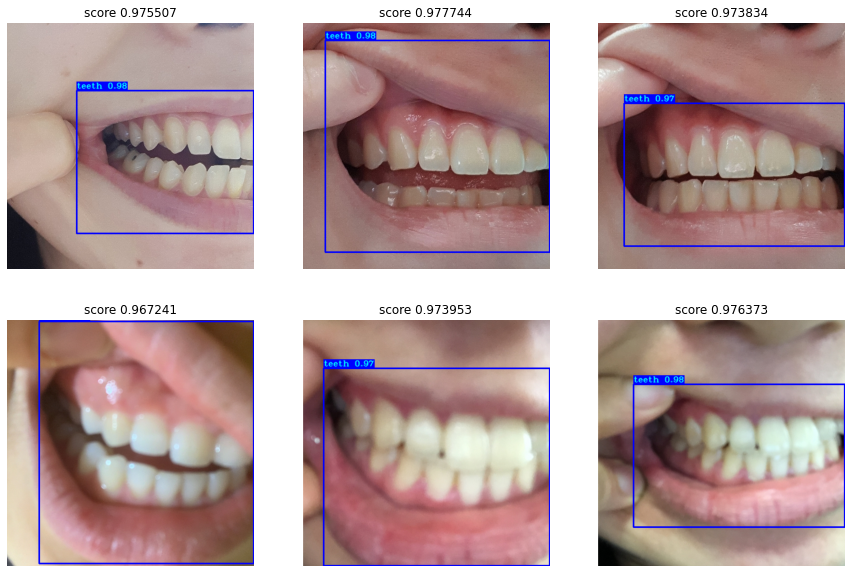

In [47]:
#train good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/train_good.jpg",bbox_inches = "tight")

In [48]:
#train bad 6 picture
if len(train_score_i)>6 : 
    roof = 6
else: 
    roof = len(train_score_i)
bad_case_train_sort = np.argsort([i for i in train_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[train_score_i[bad_case_train_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/train_bad.jpg",bbox_inches = "tight")

<Figure size 1080x720 with 0 Axes>

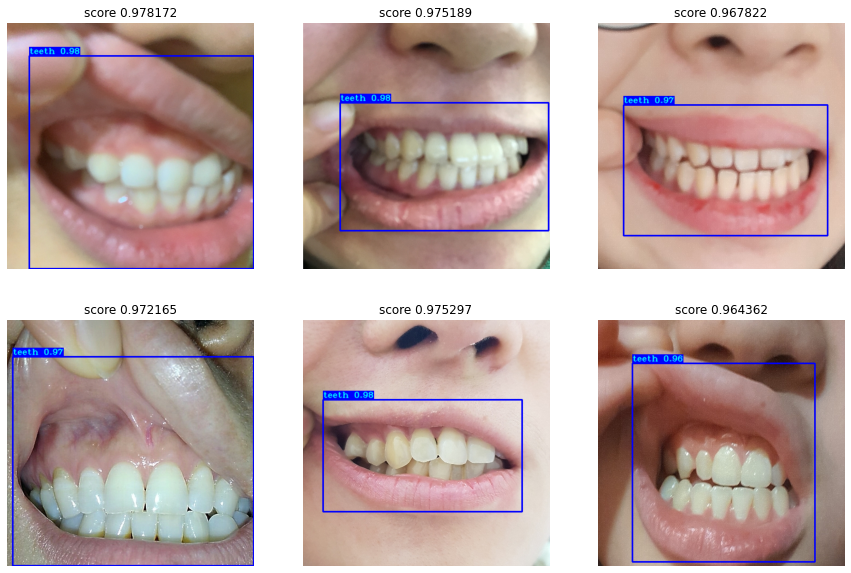

In [49]:
#test good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/valid_good.jpg",bbox_inches = "tight")

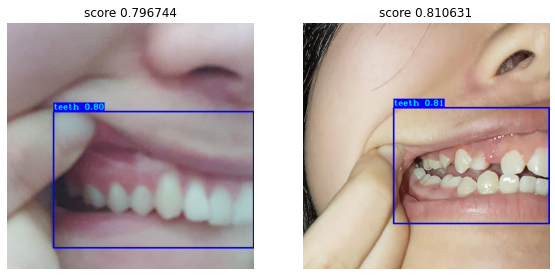

In [50]:
#test bad 6 picture
if len(valid_score_i)>6 : 
    roof = 6
else: 
    roof = len(valid_score_i)
bad_case_valid_sort = np.argsort([i for i in valid_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[valid_score_i[bad_case_valid_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/valid_bad.jpg",bbox_inches = "tight")

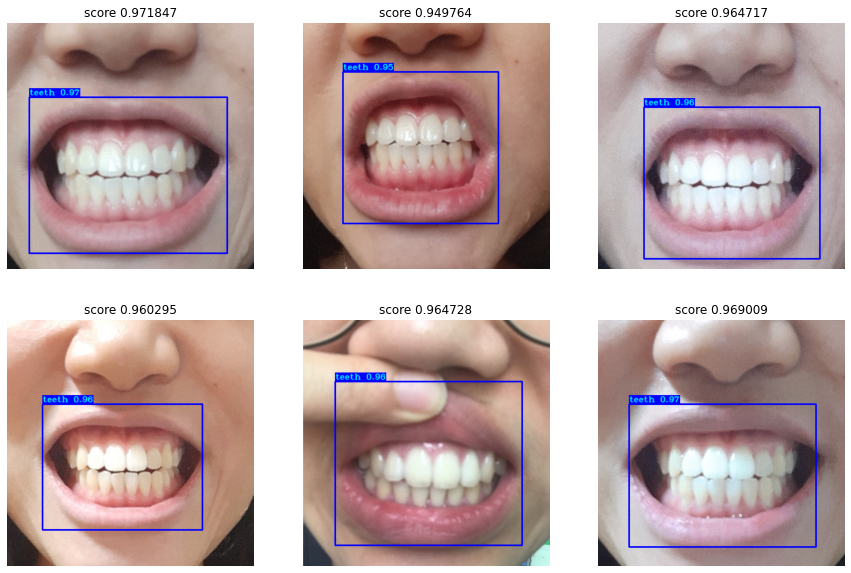

In [51]:
#test good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/test_good.jpg",bbox_inches = "tight")

In [52]:
#test bad 6 picture
if len(test_score_i)>6 : 
    roof = 6
else: 
    roof = len(test_score_i)
bad_case_test_sort = np.argsort([i for i in test_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[test_score_i[bad_case_test_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/test_bad.jpg",bbox_inches = "tight")

<Figure size 1080x720 with 0 Axes>

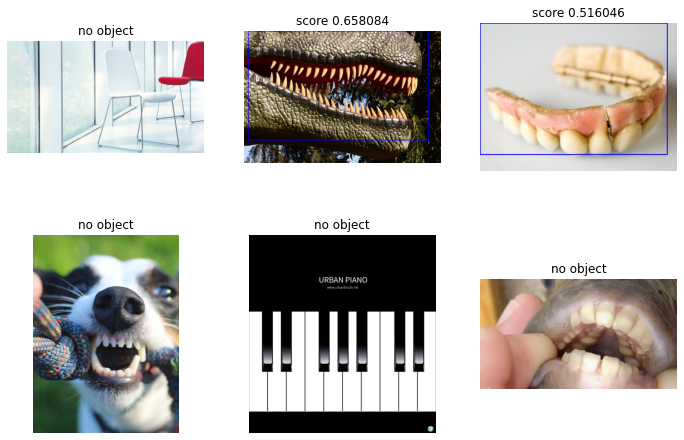

In [53]:
#anomaly
plt.figure(figsize=(12,8))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r2[-6:][i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/anomaly.jpg",bbox_inches = "tight")

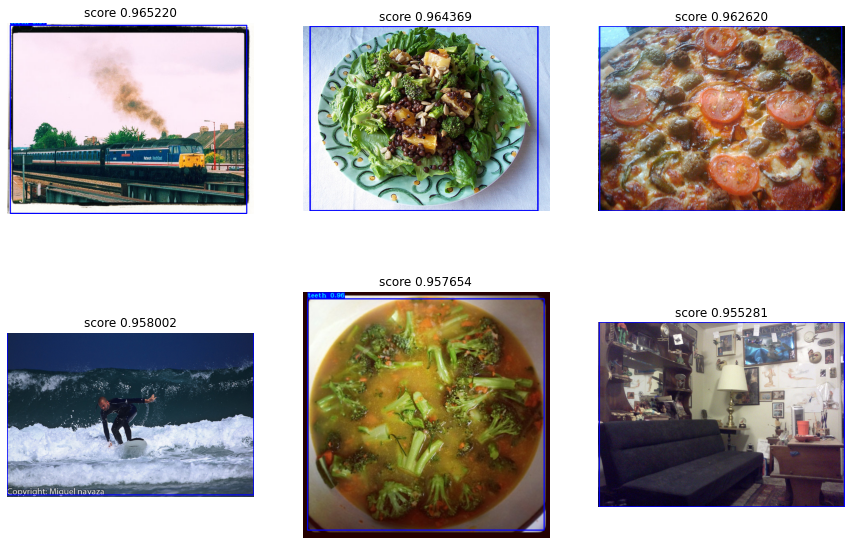

In [54]:
#coco bad 6 picture
bad_case_coco_sort_decent = np.argsort(over_anomaly_score)[::-1]
if len(bad_case_coco_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_coco_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_anomaly[over_anomaly_i[bad_case_coco_sort_decent[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/coco_bad.jpg",bbox_inches = "tight")

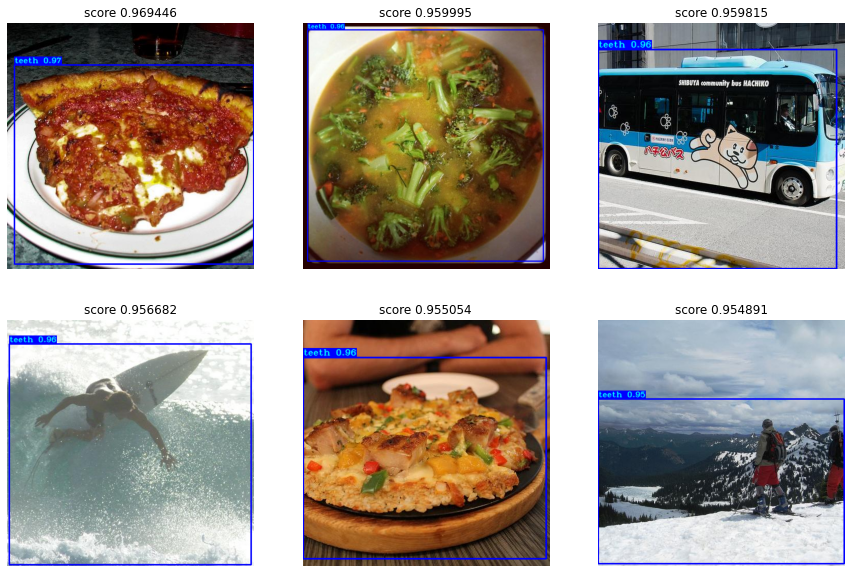

In [55]:
#coco_center bad 6 picture
bad_case_coco_sort_decent = np.argsort(over_center_anomaly_score)[::-1]
if len(bad_case_coco_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_coco_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_center_crop[over_center_anomaly_i[bad_case_coco_sort_decent[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/center_coco_bad.jpg",bbox_inches = "tight")

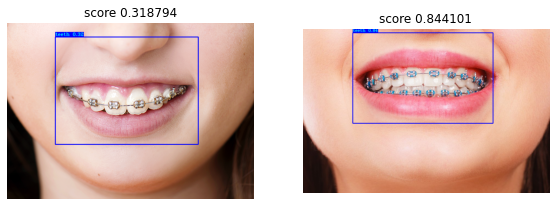

In [9]:
#braces bad 6 picture
bad_case_braces_sort_decent = np.argsort(under_braces_score)
if len(bad_case_braces_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_braces_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[under_braces_i[bad_case_braces_sort_decent[i]]]), "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/braces_bad.jpg",bbox_inches = "tight")

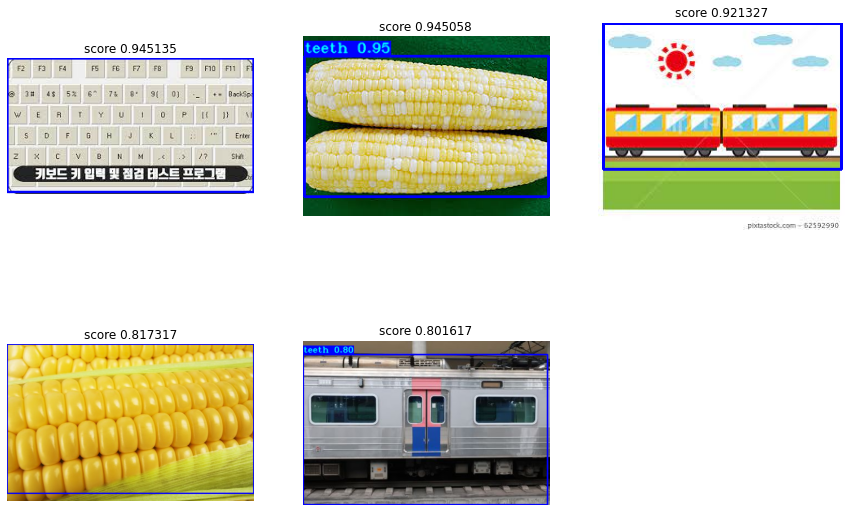

In [57]:
#angle bad 6 picture
bad_case_angle_sort_decent = np.argsort(over_angle_score)[::-1]
if len(bad_case_angle_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_angle_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[over_angle_i[bad_case_angle_sort_decent[i]]]), "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/angle_bad.jpg",bbox_inches = "tight")

In [10]:
[coco data : 18, score : 0.841437
coco data : 25, score : 0.913231
coco data : 40, score : 0.825765
coco data : 71, score : 0.866704
coco data : 113, score : 0.838557
coco data : 233, score : 0.949808
coco data : 234, score : 0.880962
coco data : 380, score : 0.837687
coco data : 386, score : 0.914641
coco data : 405, score : 0.947304
coco data : 437, score : 0.883948
coco data : 452, score : 0.898903
coco data : 496, score : 0.844954
coco data : 509, score : 0.806408
coco data : 532, score : 0.925287
coco data : 539, score : 0.940121
coco data : 545, score : 0.847825
coco data : 590, score : 0.951842
coco data : 611, score : 0.812354
coco data : 620, score : 0.811234
coco data : 625, score : 0.837013
coco data : 644, score : 0.920104
coco data : 681, score : 0.833427
coco data : 718, score : 0.905532
coco data : 769, score : 0.851005
coco data : 846, score : 0.877916
coco data : 871, score : 0.926115
coco data : 919, score : 0.845482
coco data : 966, score : 0.870241
coco data : 1030, score : 0.825039
coco data : 1035, score : 0.957654
coco data : 1072, score : 0.947235
coco data : 1106, score : 0.809052
coco data : 1130, score : 0.801271
coco data : 1139, score : 0.902156
coco data : 1158, score : 0.807453
coco data : 1170, score : 0.846013
coco data : 1208, score : 0.921141
coco data : 1231, score : 0.946459
coco data : 1239, score : 0.802595
coco data : 1310, score : 0.838868
coco data : 1408, score : 0.870793
coco data : 1420, score : 0.833216
coco data : 1422, score : 0.842255
coco data : 1454, score : 0.861472
coco data : 1477, score : 0.887383
coco data : 1478, score : 0.955281
coco data : 1705, score : 0.868290
coco data : 1710, score : 0.872140
coco data : 1836, score : 0.943678
coco data : 1868, score : 0.805624
coco data : 1890, score : 0.856263
coco data : 1921, score : 0.862693
coco data : 1947, score : 0.856072
coco data : 1957, score : 0.909975
coco data : 1970, score : 0.822356
coco data : 2151, score : 0.954494
coco data : 2163, score : 0.964369
coco data : 2170, score : 0.823199
coco data : 2182, score : 0.815922
coco data : 2219, score : 0.884785
coco data : 2258, score : 0.896025
coco data : 2396, score : 0.869711
coco data : 2626, score : 0.822542
coco data : 2630, score : 0.812000
coco data : 2685, score : 0.920975
coco data : 2701, score : 0.916403
coco data : 2707, score : 0.873118
coco data : 2716, score : 0.891691
coco data : 2733, score : 0.911148
coco data : 2768, score : 0.958002
coco data : 2777, score : 0.887126
coco data : 2854, score : 0.836468
coco data : 2905, score : 0.859268
coco data : 2911, score : 0.923154
coco data : 2929, score : 0.962620
coco data : 3009, score : 0.925583
coco data : 3015, score : 0.870692
coco data : 3034, score : 0.847569
coco data : 3049, score : 0.817492
coco data : 3131, score : 0.899933
coco data : 3132, score : 0.854434
coco data : 3155, score : 0.829181
coco data : 3156, score : 0.921303
coco data : 3164, score : 0.821333
coco data : 3196, score : 0.890691
coco data : 3285, score : 0.801334
coco data : 3343, score : 0.925867
coco data : 3354, score : 0.886019
coco data : 3400, score : 0.891553
coco data : 3414, score : 0.862008
coco data : 3434, score : 0.928728
coco data : 3485, score : 0.848144
coco data : 3540, score : 0.869796
coco data : 3549, score : 0.948095
coco data : 3636, score : 0.831706
coco data : 3659, score : 0.816459
coco data : 3676, score : 0.920700
coco data : 3716, score : 0.891934
coco data : 3742, score : 0.888396
coco data : 3808, score : 0.889194
coco data : 3825, score : 0.920684
coco data : 3849, score : 0.812545
coco data : 3864, score : 0.921744
coco data : 3866, score : 0.830060
coco data : 3883, score : 0.861153
coco data : 3889, score : 0.864755
coco data : 3903, score : 0.868233
coco data : 3920, score : 0.885212
coco data : 3992, score : 0.917833
coco data : 4084, score : 0.892194
coco data : 4116, score : 0.899159
coco data : 4137, score : 0.940221
coco data : 4140, score : 0.852168
coco data : 4143, score : 0.812298
coco data : 4153, score : 0.915076
coco data : 4224, score : 0.965220
coco data : 4272, score : 0.936270
coco data : 4281, score : 0.904455
coco data : 4284, score : 0.913450
coco data : 4328, score : 0.855541
coco data : 4378, score : 0.882413
coco data : 4394, score : 0.824622
coco data : 4430, score : 0.866999
coco data : 4458, score : 0.831192
coco data : 4474, score : 0.873124
coco data : 4542, score : 0.953356
coco data : 4588, score : 0.946446
coco data : 4611, score : 0.938043
coco data : 4632, score : 0.884633
coco data : 4644, score : 0.886154
coco data : 4662, score : 0.848081
coco data : 4669, score : 0.896042
coco data : 4740, score : 0.926887
coco data : 4756, score : 0.823745
coco data : 4801, score : 0.942288
coco data : 4832, score : 0.917059
coco data : 4900, score : 0.803567
coco data : 4949, score : 0.864315
coco data : 4958, score : 0.880707
coco data : 4980, score : 0.806917]

SyntaxError: invalid syntax (<ipython-input-10-e79130300749>, line 1)